For the past few months, Airbnb has seen a major decline in revenue. Now that the restrictions have started lifting and people have started to travel more, Airbnb wants to make sure that it is fully prepared for this change.

The different leaders at Airbnb want to understand some important insights based on various attributes in the dataset so as to increase the revenue such as -

1. Which type of hosts to acquire more and where?
2. The categorisation of customers based on their preferences.<br>
    What are the neighbourhoods they need to target?<br>
    What is the pricing ranges preferred by customers?<br>
    The various kinds of properties that exist w.r.t. customer preferences.<br>
    Adjustments in the existing properties to make it more customer-oriented.
3. What are the most popular localities and properties in New York currently?
4. How to get unpopular properties more traction? and so on...

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np

In [59]:
airbnb = pd.read_csv(r'C:\Users\sunil pc\Jupyter_files\IIIT-B-Material\DATrack12- Storytelling Case Study\AB_NYC_2019.csv')
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,19-10-2018,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,21-05-2019,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,05-07-2019,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,19-11-2018,0.10,1,0


In [60]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

The only two column that have significant number of nulls(~20%) are last_review and reviews_per_month. We will let those nulls remain. The rest of the dataset looks fine and does not need to be cleaned.

In [61]:
airbnb.describe(percentiles=[.90,.95,.99])

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
90%,3.399094e+07,2.128114e+08,40.804890,-73.907810,269.000000,28.000000,70.000000,3.630000,5.000000,337.000000
95%,3.525910e+07,2.417646e+08,40.825643,-73.865771,355.000000,30.000000,114.000000,4.640000,15.000000,359.000000
99%,3.623888e+07,2.677118e+08,40.864661,-73.776920,799.000000,45.000000,214.000000,7.195800,232.000000,365.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


#### We can see that-
1. price variable mean is much higher that median, which means that distribution is right skewed.
2. minimum_nights too has mean much higher than median, so this is also right skewed distribution. There are possible outliers in this variable.
3. number_of_reviews and reviews_per_month are also heavily right skewed, since the difference between the 90th percentile and maximum value is huge.
4. calculated_host_listings_count is also heavily right skewed.

### 1. Analysis of minimum_nights

#### 1.1 Analysis of no. of rooms for rent by minimum_nights

In [62]:
groupbyMinnights = airbnb.groupby(by=['minimum_nights']).count()
groupbyMinnights = groupbyMinnights.reset_index()
groupbyMinnights.head()

,minimum_nights,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,1,12720,12712,12720,12708,12720,12720,12720,12720,12720,12720,12720,9889,9889,12720,12720
1,2,11696,11696,11696,11694,11696,11696,11696,11696,11696,11696,11696,10302,10302,11696,11696
2,3,7999,7997,7999,7998,7999,7999,7999,7999,7999,7999,7999,6842,6842,7999,7999
3,4,3303,3300,3303,3300,3303,3303,3303,3303,3303,3303,3303,2753,2753,3303,3303
4,5,3034,3033,3034,3034,3034,3034,3034,3034,3034,3034,3034,2425,2425,3034,3034


In [63]:
fig = px.line(groupbyMinnights,
        x='minimum_nights',
        y='id',
        width = 800, height=400)
fig.update_xaxes(range=[0, 50])
fig.update_yaxes(range=[0, 13000])
fig.update_layout(height=400, width=800,
                  title_text='Number of rooms for rent vs minimum_nights',
                  xaxis_title="minimum_nights",
                  yaxis_title="Number of rooms for rent")
fig.show()

1. Most people prefer to rent airbnb rooms for one-three night.
2. Consequent smaller spikes are at 7, 10, 14- these rooms also seem to be very popular.
3. Many people also prefer to rent for a month- maybe these are those who come for business purposes.

Let's explore this further.

In [64]:
airbnb.groupby(by='neighbourhood_group').minimum_nights.describe()

,count,mean,std,min,25%,50%,75%,max
neighbourhood_group,,,,,,,,
Bronx,1091.0,4.560953,15.631792,1.0,1.0,2.0,3.0,365.0
Brooklyn,20104.0,6.056556,17.632726,1.0,2.0,3.0,5.0,999.0
Manhattan,21661.0,8.579151,24.050857,1.0,1.0,3.0,6.0,1250.0
Queens,5666.0,5.181433,15.028725,1.0,1.0,2.0,3.0,500.0
Staten Island,373.0,4.831099,19.727605,1.0,1.0,2.0,3.0,365.0


#### 1.2 Analysis of neighbourhood_group by minimum_nights

We can see a huge right skew in the minimum_nights of Manhattan, the mean is 8.58 and the median is 3. The others are also right skewed, but not as much as Manhattan.

In [65]:
groupbyNeighbourhoodMinnights = airbnb.groupby(by=['neighbourhood_group','minimum_nights']).count()
groupbyNeighbourhoodMinnights = groupbyNeighbourhoodMinnights.reset_index(level='minimum_nights')
groupbyNeighbourhoodMinnights.head(2)

,minimum_nights,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
neighbourhood_group,,,,,,,,,,,,,,,
Bronx,1,362,361,362,362,362,362,362,362,362,362,286,286,362,362
Bronx,2,357,357,357,357,357,357,357,357,357,357,305,305,357,357


In [66]:
# Creating a list of all the neighbourhoods

neighbourhoodList = groupbyNeighbourhoodMinnights.index.unique().tolist()

In [67]:
# Plotting the number of rooms for rent vs minimum_nights for each neighbourhood

import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=5, cols=1, start_cell="top-left",
                   subplot_titles= neighbourhoodList,
#                    shared_xaxes=True,
                   vertical_spacing=0.05)


for i in range (len(neighbourhoodList)):
    neighbourhood = neighbourhoodList[i]
    fig.add_trace(go.Scatter(y=groupbyNeighbourhoodMinnights.loc[neighbourhood].id,
                             x=groupbyNeighbourhoodMinnights.loc[neighbourhood].minimum_nights,
                            name = neighbourhood), 
                  row=(i+1), col=1)


fig.update_layout(height=1000, width=1000,
                  title_text="Different Neighbourhoods' number of rooms for rent at different minimum_nights")
fig.update_xaxes(range=[0, 35])
fig.update_yaxes(range=[0, 6000])
fig.show()

1. Manhattan and Brooklyn are the neighbourhoods getting a lot of people renting rooms for 30 days.
2. Staten Island and Bronx is not a very popular spot to rent rooms.

### 2. Analysis by Price

#### 2.1 Price and no. of rooms variation per neighbourhood

In [68]:
airbnb.head(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,19-10-2018,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,21-05-2019,0.38,2,355


In [69]:
groupbyNeighbourhood = airbnb.groupby(by=['neighbourhood_group', 'neighbourhood']).agg({
    'id':'count',
    'host_id':sum,
    'price':sum,
    'minimum_nights':sum,
    'number_of_reviews':sum,
    'reviews_per_month':sum,
    'calculated_host_listings_count':sum,
    'availability_365':sum,
    'latitude':'first',
    'longitude':'first'
})

groupbyNeighbourhood.head(2)

id     host_id  price  minimum_nights  \
neighbourhood_group neighbourhood                                          
Bronx               Allerton       42  4418588659   3679              93   
                    Baychester      7   973913711    528              17   

                                   number_of_reviews  reviews_per_month  \
neighbourhood_group neighbourhood                                         
Bronx               Allerton                    1803              67.86   
                    Baychester                   310              13.24   

                                   calculated_host_listings_count  \
neighbourhood_group neighbourhood                                   
Bronx               Allerton                                  116   
                    Baychester                                 12   

                                   availability_365  latitude  longitude  
neighbourhood_group neighbourhood                                         
Bronx               Allerton                   6874  40.86466  -73.85709  
                    Baychester                 1105  40.87223  -73.84335

In [70]:
# Room prices and number of rooms for rent in each neighbourhood of Bronx

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(groupbyNeighbourhood.loc['Bronx'], lat="latitude", lon="longitude", color="price", size="id",
                        text = groupbyNeighbourhood.loc['Bronx'].index,
                  color_continuous_scale=px.colors.sequential.Plasma, size_max=20, zoom=10)

fig.update_layout(title='Room prices and number of rooms for rent in each neighbourhood of Bronx')

fig.update_geos(fitbounds="locations")
fig.show()

In above map, colour is adjusted according to the sum of prices of rooms in the particular neighbourhood.
Size according to the number of rooms for rent rooms in that neighbourhood.

In the neighbourhood of Bronx, following are the hottest spots for rooms:
1. Kingsbridge(Price=5455, no of rooms=70)
2. Longwood(Price=5699, no of rooms=62)
3. Fordham(Price=4375, no of rooms=63)
4. Mott Haven(Price=5335, no of rooms=60)
5. Concourse(Price=4309, no of rooms=50) are the hottest spots for rooms.

In [71]:
# Room prices and number of rooms for rent in each neighbourhood of Brooklyn

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(groupbyNeighbourhood.loc['Brooklyn'], lat="latitude", lon="longitude", color="price", size="id",
                        text = groupbyNeighbourhood.loc['Brooklyn'].index,
                  color_continuous_scale=px.colors.sequential.Plasma, size_max=20, zoom=10)

fig.update_layout(title='Room prices and number of rooms for rent in each neighbourhood of Brooklyn')

fig.update_geos(fitbounds="locations")
fig.show()

In the neighbourhood of Brooklyn:
1. Williamsburg (Price=563707, no of rooms=3920)
2. Bedford-Stuyvesant (Price=399917, no of rooms=3714) 
3. Bushwick (Price=209033, no of rooms=2465) are the hottest spots for rooms.

In [72]:
# Room prices and number of rooms for rent in each neighbourhood of Manhattan

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(groupbyNeighbourhood.loc['Manhattan'], lat="latitude", lon="longitude", color="price", size="id",
                        text = groupbyNeighbourhood.loc['Manhattan'].index,
                  color_continuous_scale=px.colors.sequential.Plasma, size_max=20, zoom=10)

fig.update_layout(title='Room prices and number of rooms for rent in each neighbourhood of Manhattan')

fig.update_geos(fitbounds="locations")
fig.show()

In the neighbourhood of Manhattan:
1. Harlem (Price=316233, no of rooms=2658)
2. Hell's Kitchen (Price=400987, no of rooms=1958) 
3. Upper West Side (Price=415720, no of rooms=1971)
4. East Village (Price=344812, no of rooms=1853)
5. Upper East Side (Price=339729, no of rooms=1800) are the hottest spots for rooms.

In [73]:
# Room prices and number of rooms rented in each neighbourhood of Queens

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(groupbyNeighbourhood.loc['Queens'], lat="latitude", lon="longitude", color="price", size="id",
                        text = groupbyNeighbourhood.loc['Queens'].index,
                  color_continuous_scale=px.colors.sequential.Plasma, size_max=20, zoom=10)

fig.update_layout(title='Room prices and number of rooms for rent in each neighbourhood of Queens')

fig.update_geos(fitbounds="locations")
fig.show()

In the neighbourhood of Queens:
1. Astoria (Price=105469, no of rooms=900)
2. Long Island City (Price=68449, no of rooms=537) are the hottest spots for rooms.

In [74]:
# Room prices and number of rooms for rent in each neighbourhood of Staten Island

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(groupbyNeighbourhood.loc['Staten Island'], lat="latitude", lon="longitude", color="price", size="id",
                        text = groupbyNeighbourhood.loc['Staten Island'].index,
                  color_continuous_scale=px.colors.sequential.Plasma, size_max=20, zoom=10)

fig.update_layout(title='Room prices and number of rooms for rent in each neighbourhood of Staten Island')

fig.update_geos(fitbounds="locations")
fig.show()

In the neighbourhood of Staten Island:
1. Randall Manor (Price=6384, no of rooms=19)
2. St. george (Price=5671, no of rooms=48)
3. Tompkinsville (Price=3200, no of rooms=42) are the hottest spots for rooms.

#### Useful insights gained from above analysis:

1. Brooklyn is the best neighbourhood_group to have more number of rooms, since the prices are very high and it also seems very popular.
2. In Brooklyn, it is recommended to increase density of airbnb's around WIlliamsburg, Bedford-Stuyvesant and Bushwick as they are all located closeby.
3. Manhattan is also a very popular neighbouhood_group. Can increase density of rooms in north Manhattan  vicinity of Harlem and Upper East Side.

#### 2.2 Analysing mean price per neighbourhood in each neighbourhood_group for all neighbourhood_groups

In [75]:
GroupbyNeighbourhoodmean = airbnb.groupby(by = ['neighbourhood_group','neighbourhood']).mean()
GroupbyNeighbourhoodmean = GroupbyNeighbourhoodmean.reset_index()
GroupbyNeighbourhoodmean.head()

,neighbourhood_group,neighbourhood,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Bronx,Allerton,2.007729e+07,1.052045e+08,40.865292,-73.858727,87.595238,2.214286,42.928571,1.834054,2.761905,163.666667
1,Bronx,Baychester,2.215566e+07,1.391305e+08,40.873616,-73.842967,75.428571,2.428571,44.285714,2.206667,1.714286,157.857143
2,Bronx,Belmont,2.690317e+07,1.468852e+08,40.855062,-73.887109,77.125000,3.375000,12.333333,1.888000,1.583333,187.666667
3,Bronx,Bronxdale,2.190473e+07,1.105278e+08,40.854731,-73.866287,57.105263,2.894737,24.105263,1.916875,1.105263,145.421053
4,Bronx,Castle Hill,3.304754e+07,2.257518e+08,40.816889,-73.847000,63.000000,2.333333,13.111111,2.775000,5.666667,159.333333


In [76]:
# Mean price per neighbourhood on map

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(GroupbyNeighbourhoodmean,
                        lat="latitude",
                        lon="longitude",
                        color="number_of_reviews",
                        size="price",
#                         size='price',
#                         text = GroupbyNeighbourhoodmean.neighbourhood,
                        hover_data = ['neighbourhood_group','neighbourhood'],
                        color_continuous_scale=px.colors.sequential.Plasma,
                        size_max=15,
                        zoom=10)

fig.update_layout(height=600,
                 title='Mean price per neighbourhood')

fig.update_geos(fitbounds="locations")
fig.show()

#### Surprising insights:
1. Two neighbourhoods in Staten Island command very high prices- Fort Wadsworth and Woodrow, even though Staten Island does not have many airbnb's. These two neighbourhoods also do not have any reviews on airbnb's, so insight is to decrease prices or remove them from airbnb.
2. Silver Lake neighbourhood in Staten Island neighbourhood_group is very popular(has many reviews) but price is low. Insight is to increase prices here.
3. Two neighburhoods in Queens also command high prices- Belle Harbor and Breezy Point.
4. Almost all of Manhtaan commands high prices as expected.
5. Brooklyn, inspite of having high densities of airbnb's, does not command high prices except in some northern neighbourhoods like Vinegar Hill and Navy Yard, and even that could be due to their proximity to Manhattan.

#### Advice for Airbnb Executives:
1. Decrease no of airbnb's in neighbourhoods of Brooklyn which don't command high prices. It may be due to oversaturation.

#### 2.3 Analysing price with limit on number_of_reviews

In [77]:
# Plot of airbnb's with limit on number_of_reviews with price

GroupbyNeighbourhoodmean.head()

GroupbyNeighbourhoodmeanlimited = GroupbyNeighbourhoodmean.loc[GroupbyNeighbourhoodmean['number_of_reviews'] <= 5]

In [78]:
# Mean price per neighbourhood on map

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(GroupbyNeighbourhoodmeanlimited,
                        lat="latitude",
                        lon="longitude",
                        color="number_of_reviews",
                        size="price",
#                         size='price',
#                         text = GroupbyNeighbourhoodmean.neighbourhood,
                        hover_data = ['neighbourhood_group','neighbourhood'],
                        color_continuous_scale=px.colors.sequential.Plasma,
                        size_max=15,
                        zoom=10)

fig.update_layout(height=650,
                 title='Mean price per neighbourhood with number_of_reviews less than 5')

fig.update_geos(fitbounds="locations")
fig.show()

#### Insights:

1. Neighbourhood New Drop in Staten Island does not seem to be very popular as it has 0 reviews and price is also low which means that the airbnb must not be very good. So drop all properties from this neighbourhood from airbnb.
2. Fort Wadsworth and Woodrow from Staten Island, Sea Gate from Brooklyn and Breezy Point from Queens should be dropped from airbnb as they have very high prices but no visitors.

### 3. Correlation heatmap for checking correlation between quantitative variables.

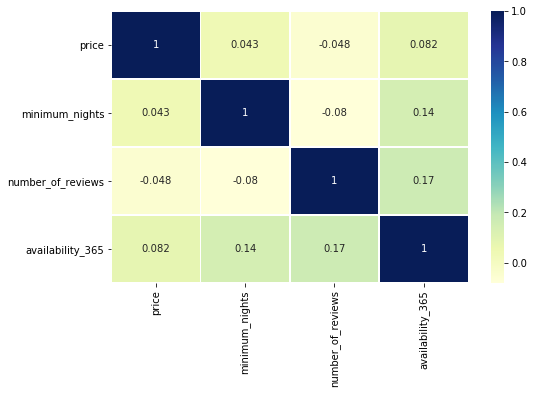

In [79]:
data = airbnb[['price','minimum_nights','number_of_reviews','availability_365']]

plt.figure(figsize=(8,5))
fig = sns.heatmap(data.corr(), annot=True, linewidths=.5, cmap='YlGnBu')
plt.show()

None of the numerical variables are highly correlated with each other.

### 4. Analysis of availability_365 variable

#### 4.1 Univariate analysis of availability_356

In [80]:
airbnb.head(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,19-10-2018,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,21-05-2019,0.38,2,355


In [81]:
px.histogram(airbnb['availability_365'])

In [82]:
airbnb.loc[airbnb['availability_365'] == 0].shape

(17533, 16)

17533 properties are showing available for 0 nights out of 365. Maybe these properties have shut, or they have rented to some other competitor.

#### 4.2 Plot of all locations with availability_365  = 0

In [83]:
availability_365is0 = airbnb.loc[airbnb['availability_365'] == 0]
availability_365is0.head(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,19-11-2018,0.1,1,0
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,05-10-2017,0.4,1,0


In [84]:
# Plot of all listings with availability_365 = 0

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(availability_365is0,
                        lat="latitude",
                        lon="longitude",
                        color="neighbourhood_group",
#                         size="price",
#                         text = availability_365is0.neighbourhood_group,
                        hover_data = ['neighbourhood_group','neighbourhood'],
                        color_continuous_scale=px.colors.sequential.Plasma,
#                         size_max=10,
                        zoom=10)
fig.update_layout(height=650,
                 mapbox_style = 'open-street-map',
                 title = 'Map of all listings which are available 0 days out of 365')

fig.update_geos(fitbounds="locations")
fig.show()

Spread of properties with availibility_365 = 0 is consistent with the number of listings per neighbourhood. There is not pattern in this, all these properties are evenly spread out.

#### Insight : 
1. Either drop these properties from airbnb, or offer them more incentive to stay with airbnb, so that travellers are not disappointed when they try to book with a listing and find out that it is not available.

#### 4.3 Analysing properties price with respect to with availability_365, where availability_365 not equal to 0

In [85]:
fig = px.line(x = airbnb.loc[airbnb['availability_365']!=0].groupby(by='availability_365').mean().index,
              y = airbnb.loc[airbnb['availability_365']!=0].groupby(by='availability_365').mean().price)

fig.update_layout(height=400, width=800,
                  title_text='Price vs availability_365',
                  xaxis_title="availability_365",
                  yaxis_title="price")

Can't see any obvious relation between price and availablity_365.

#### 4.3 Analysing properties number of rooms with respect to with availability_365, where availability_365 not equal to 0

In [86]:
figure = px.histogram(airbnb.loc[airbnb['availability_365']!= 0].availability_365)

figure.update_layout(height=400, width=800,
                  title_text='Availability_365 vs number of rooms for rent',
                  xaxis_title="Availability_365",
                  yaxis_title="Number of rooms for rent")

Spikes in airbnb's with availability_365 1-10 and 360-365.

#### Insight:
1. 2447 rooms with availability 1-10 days per year. This could be because these owners don't want to invest in their properties for the rest of the year, or they are using it for some other speficic reasons.

#### 4.4 Analysing number_of_reviews vs availability_365

In [87]:
LimitedAvailability_365 = airbnb.loc[(airbnb['availability_365']<200) & (airbnb['availability_365'] != 0)]
LimitedAvailability_365 = LimitedAvailability_365.groupby(by=['availability_365']).mean()
LimitedAvailability_365 = LimitedAvailability_365.reset_index()
LimitedAvailability_365.head(2)

,availability_365,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count
0,1,2.207884e+07,5.950680e+07,40.733447,-73.955047,129.509804,6.676471,25.443627,1.453079,6.487745
1,2,2.279619e+07,6.525578e+07,40.728681,-73.960863,145.944444,4.974074,21.914815,1.528958,2.225926


In [88]:
fig = px.bar(x=LimitedAvailability_365['availability_365'],
      y= LimitedAvailability_365['number_of_reviews'])

fig.update_layout(width = 900, height=500,
                 title = 'Availability 365 vs number of reviews',
                 xaxis_title="minimum_nights",
                  yaxis_title='Number of reviews')

fig.show()

We can see clear dips in the graph in two spots-
1. At around minimum_nights = 90
2. At around minimum_nights = 180

#### Insight :
Discourage airbnb owners to keep airbnb's available for 88-90 days and 176-181 days ans people prefer renting for either 3months or 6months, and these figures are just 2-3 days less than 3months/6months.

### 5. Analysing room_type

#### 5.1 Breakup of room type by percentage

In [89]:
# Creating a new column for percentage of each room type

GroupbyRoom = airbnb.groupby(by='room_type').count()
GroupbyRoom['%_of_room_type'] = ((GroupbyRoom['id']/airbnb.id.count())*100)
GroupbyRoom

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,%_of_room_type
room_type,,,,,,,,,,,,,,,,
Entire home/apt,25409,25402,25409,25400,25409,25409,25409,25409,25409,25409,25409,20332,20332,25409,25409,51.966459
Private room,22326,22318,22326,22314,22326,22326,22326,22326,22326,22326,22326,17665,17665,22326,22326,45.661111
Shared room,1160,1159,1160,1160,1160,1160,1160,1160,1160,1160,1160,846,846,1160,1160,2.372431


In [90]:
# Room type percentage breakup plot pie chart

fig = px.pie(values=GroupbyRoom['%_of_room_type'], 
             names=GroupbyRoom.index,
             color_discrete_sequence=px.colors.sequential.RdBu)

fig.update_layout(width = 500, height=500,
                  title='Room type percentage breakup',
                  margin=dict(l=2, r=2, t=40, b=2))

fig.show()

Entire home/apt and private room are for rent in almost equal numbers. Shared rooms are very less as people prefer privacy.

#### 5.2 Room_type vs availability_365

In [91]:
groupByRoomAvailability_365 = airbnb.groupby(by =['room_type', 'availability_365']).count().reset_index(level='availability_365')
groupByRoomAvailability_365 = groupByRoomAvailability_365.loc[groupByRoomAvailability_365['availability_365'] !=0]

In [92]:
room_type = airbnb.room_type.unique()

# for room in room_type:
#     figure = px.line(x=groupByRoom.loc[room].availability_365,
#                      y=groupByRoom.loc[room].id,
#                     name = room)
    
#     figure.update_layout(height=400, width=800,
#                   title_text='Availability_365 vs number of rooms',
#                   xaxis_title="Availability_365",
#                   yaxis_title="Number of rooms for rent vs availability_365")
    
#     figure.show()
#     figure.update_yaxes(range=[0, 700])
    

fig = make_subplots(rows=3, cols=1, start_cell="top-left",
                   subplot_titles= room_type,
#                    shared_xaxes=True,
                   vertical_spacing=0.08)


for i in range (len(room_type)):
    room = room_type[i]
    fig.add_trace(go.Scatter(y=groupByRoomAvailability_365.loc[room].id,
                             x=groupByRoomAvailability_365.loc[room].availability_365,
                            name = room), 
                  row=(i+1), col=1)


fig.update_layout(height=600, width=1000,
                  title_text='Availability_365 vs number of rooms')
fig.update_yaxes(range=[0, 700])
fig.show()

1. Many Entire Home/Apt for rent with availability less than 30 days a year.
2. Shared Rooms not preferred by a lot of people as very few are on rent compared to other two room types.
3. Entire home/apt and private rooms have almost the same plots, spikes and dips in the same places.

#### 5.3 Room_type vs neighbourhood_group

In [93]:
groupByRoomNeighbourhoodGroup = airbnb.groupby(by = ['neighbourhood_group', 'room_type']).agg({
    'id':'count',
    'host_id':sum,
    'price':'mean',
    'minimum_nights':sum,
    'number_of_reviews':sum,
    'reviews_per_month':sum,
    'calculated_host_listings_count':sum,
    'availability_365':sum,
    'latitude':'first',
    'longitude':'first'
})
groupByRoomNeighbourhoodGroup = groupByRoomNeighbourhoodGroup.reset_index(level='neighbourhood_group')
groupByRoomNeighbourhoodGroup.head()

,neighbourhood_group,id,host_id,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,latitude,longitude
room_type,,,,,,,,,,,
Entire home/apt,Bronx,379,39316440023,127.506596,2258,11627,691.58,707,59882,40.88057,-73.83572
Private room,Bronx,652,69163238891,66.788344,2516,16312,860.23,1525,111708,40.83232,-73.93184
Shared room,Bronx,60,6740701291,59.800000,202,432,58.13,205,9253,40.88437,-73.89746
Entire home/apt,Brooklyn,9559,464730275676,178.327545,62433,267128,10757.13,17568,929184,40.68514,-73.95976
Private room,Brooklyn,10132,632503851692,76.500099,56126,213653,10037.27,25808,1012369,40.64749,-73.97237


In [94]:
neighbourhoodList

['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island']

In [95]:
# Creating a column in dataset for percentage of room type in each neighbourhood_group.head

mylist = []
for neighbourhood in neighbourhoodList:
    part2 = (groupByRoomNeighbourhoodGroup.groupby(by='neighbourhood_group').sum().loc[neighbourhood].id)
    part1 = (groupByRoomNeighbourhoodGroup.loc[groupByRoomNeighbourhoodGroup['neighbourhood_group'] == neighbourhood].id)
    mylist.append((((part1/part2)*100)[0]))
    mylist.append((((part1/part2)*100)[1]))
    mylist.append((((part1/part2)*100)[2]))
myarray = np.asarray(mylist)
# print(myarray)

groupByRoomNeighbourhoodGroup['Perc_of_room_type_in_region'] = myarray

# Changing the name of id column to 'Number of rooms for rent'
groupByRoomNeighbourhoodGroup.rename({'id':'Number of rooms for rent'}, axis = 'columns', inplace=True)
groupByRoomNeighbourhoodGroup.head(2)

,neighbourhood_group,Number of rooms for rent,host_id,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,latitude,longitude,Perc_of_room_type_in_region
room_type,,,,,,,,,,,,
Entire home/apt,Bronx,379,39316440023,127.506596,2258,11627,691.58,707,59882,40.88057,-73.83572,34.738772
Private room,Bronx,652,69163238891,66.788344,2516,16312,860.23,1525,111708,40.83232,-73.93184,59.761687


In [96]:
# Plotting clustered bar chart for number of rooms per room_type per neighbourhood_group

figure = px.bar(groupByRoomNeighbourhoodGroup,
                x = 'neighbourhood_group',
                y = 'Number of rooms for rent',
                color = groupByRoomNeighbourhoodGroup.index,
                barmode ='group',
               hover_data = ['Perc_of_room_type_in_region','number_of_reviews'])

figure.update_layout(height=500, width=950,
                  title_text='No of rooms per room_type per neighbourhood_group',
                    xaxis_title = 'Neighbourhood Group',
                    yaxis_title = 'No of rooms')

figure.show()

1. Brooklyn and Manhattan are the most popular neighbourhood groups for rooms. In Brooklyn the most popular room type is Private room(50.4%) by a small margin over Entire home/apt(47.5%), and in Manhattan it is Entire home/apt(61%) by a huge margin over private room(37%).
2. Shared rooms are not very popular among travellers. The maximum % they constitute in any region of the total no of rooms for rent is 5% in Bronx.

#### 5.4 Plotting all room_types per neighbourhood on map

In [97]:
Brooklyn = airbnb.loc[airbnb['neighbourhood_group'] == 'Brooklyn']
Brooklyn.head(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,19-10-2018,0.21,6,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,05-07-2019,4.64,1,194


In [98]:
mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

# color_discrete_map = {'Entire home/apt': 'rgb(215,48,39)', 'Private room': 'rgb(215,148,39)', 'Shared room':'rgb(215,248,39)'}

fig = px.scatter_mapbox(Brooklyn, lat="latitude", lon="longitude", color='room_type',
#                         color_discrete_map = color_discrete_map,
                        size_max=20, zoom=10,
                       opacity=0.7,
                       hover_data=['neighbourhood'])

fig.update_geos(fitbounds="locations")

fig.update_layout(height=500, width=900,
                  title_text='Spread of different room types in Brooklyn')
fig.show()

Can see almost equal number of blues and reds.
1. Very dense packing of both private room and Entire home/apt in area of Williamsburg, Bedford-Stuyvesant.
2. Dense packing of Private room in Bushwick.
3. Moderate packing of private room and Entire home/apt in area of Greenpoint.

In [99]:
Bronx = airbnb.loc[airbnb['neighbourhood_group'] == 'Bronx']
# Bronx.head(2)

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(Bronx, lat="latitude", lon="longitude", color='room_type',
                        size_max=20, zoom=10,
                       opacity=0.7,
                       hover_data=['neighbourhood'])

fig.update_geos(fitbounds="locations")

fig.update_layout(height=500, width=900,
                  title_text='Spread of different room types in Bronx')
fig.show()

Can clearly see more blues(more private rooms) than reds(Entire home/apt) in Bronx. Almost 60% airbnb's in Bronx are private rooms, and around 39% entire home/apt.
1. All airbnb's are quite spread out in general, but can see some clustering at Concourse and Mott Haven.

In [100]:
Manhattan = airbnb.loc[airbnb['neighbourhood_group'] == 'Manhattan']
# Manhattan.head(2)

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(Manhattan, lat="latitude", lon="longitude", color='room_type',
                        size_max=20, zoom=10,
                       opacity=0.7,
                       hover_data=['neighbourhood'])

fig.update_geos(fitbounds="locations")

fig.update_layout(height=350, width=900,
                  margin=dict(l=0, r=0, t=40, b=0),
                  title='Spread of different room types in Manhattan')
fig.show()

Very high presence of both Entire home/apt and Private room in Manhattan.
1. Clustering of Private rooms in north Harlem and Entire home/apt in south Harlem.
2. Clustering of Private rooms in north part of Upper West Side and Upper East Side neighbourhoods, and surprisingly little presence of in rest of this neighbourhood. The rest of these neighbourhoods thick clusters of Entire home/apt.
3. Clustering of shared room in Hell's Kitchen neighbourhood, and some presence of Shared rooms in Kips Bay. Very little to none shared rooms in rest of Manhattan.
4. Very thick clustering of Entire home/apt in neighbourhoods of Chelsea, Kips Bay and West Village.
5. Very thick clustering of both Entire home/apt and Private rooms in neighbourhood of East Village and Lower East Side.
6. Small cluster of Entire home/apt in Financial District.

In [101]:
Queens = airbnb.loc[airbnb['neighbourhood_group'] == 'Queens']
# Manhattan.head(2)

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(Queens, lat="latitude", lon="longitude", color='room_type',
                        size_max=20, zoom=10,
                       opacity=0.7,
                       hover_data=['neighbourhood'])

fig.update_geos(fitbounds="locations")

fig.update_layout(height=500, width=900,
                  title_text='Spread of different room types in Queens')
fig.show()

Sparse distribution of airbnb's throughout Queens except the NorthWestern part.
1. Thick clustering of Private rooms in Astoria, smaller cluster of Entire home/apt in Astoria too.
2. Small clusters of Private room in Sunny Side, and Ridgewood.

In [102]:
StatenIsland = airbnb.loc[airbnb['neighbourhood_group'] == 'Staten Island']
# Manhattan.head(2)

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(StatenIsland, lat="latitude", lon="longitude", color='room_type',
                        size_max=20, zoom=10,
                       opacity=0.7,
                       hover_data=['neighbourhood'])

fig.update_geos(fitbounds="locations")

fig.update_layout(height=500, width=900,
                  title_text='Spread of different room types in Staten Island')
fig.show()

Very sparse distribution on airbnb's.
1. No clusters per say except small cluster of private room in St. George.

#### 5.5 Price by room_type

In [103]:
# Grouping room type by price

groupByRoomPrice = airbnb.groupby(by =['room_type', 'price']).agg({
    'id':'count',
    'host_id':sum,
    'minimum_nights':sum,
    'number_of_reviews':sum,
    'reviews_per_month':sum,
    'calculated_host_listings_count':sum,
    'availability_365':sum,
    'latitude':'first',
    'longitude':'first'
})

groupByRoomPrice = groupByRoomPrice.reset_index(level='price')
groupByRoomPrice = groupByRoomPrice.loc[groupByRoomPrice['price'] !=0]
groupByRoomPrice.head(3)

,price,id,host_id,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,latitude,longitude
room_type,,,,,,,,,,
Entire home/apt,10,7,529331078,41,187,10.13,10,757,40.73051,-73.98140
Entire home/apt,11,2,109745304,9,113,3.86,2,534,40.68994,-73.91556
Entire home/apt,12,2,5804226,303,0,0.00,2,0,40.70588,-74.01590


In [104]:
# Initialize figure
fig = go.Figure()

df_room_type = airbnb[airbnb['price']<2000]

# Add Traces

fig.add_trace(
    go.Box(y=list(df_room_type[df_room_type['room_type'] == 'Entire home/apt']['price'].reindex()),
               name="Entire home/apt",
               line=dict(color="#33CFA5")))

fig.add_trace(
    go.Box(y=list(df_room_type[df_room_type['room_type'] == 'Private room']['price'].reindex()),
               name="Private room",
               line=dict(color="#F06A6A")))

fig.add_trace(
    go.Box(y=list(df_room_type[df_room_type['room_type'] == 'Shared room']['price'].reindex()),
               name="Shared room",
               line=dict(color="#AA0DFE")))

# Set title
fig.update_layout(title_text="Price Distribution by Room Type",xaxis_title="Room Type")

fig.show()


Median price of Entire home/apt is higher than Private room and shared room. Insight to airbnb is: Increase the listings of entire home/apt.

1. Clearly see that price for entire home/apt is slightly higher than private room, we would have expected there to be a much larger gap between the price of the two.
2. There are more private rooms to rent on the lower price side of private rooms, whereas more entire home/apt for rent on the higher side of price for entire home/apt.
3. Shared room is much cheaper than both private room and entire home/apt, but is very low in demand and hence very low in supply.

#### 5.6 Price vs.number of rooms for each room type

In [105]:
# Defining three subplots starting with top left subplot
fig = make_subplots(rows=3, cols=1, start_cell="top-left",
                   subplot_titles= room_type,
#                    shared_xaxes=True,
                   vertical_spacing=0.08)

# For each room type in df, plot number of rooms for rent vs price for that type of room
for i in range (len(room_type)):
    room = room_type[i]
    fig.add_trace(go.Scatter(y=groupByRoomPrice.loc[room].id,
                             x=groupByRoomPrice.loc[room].price,
                            name = room), 
                  row=(i+1), col=1)


fig.update_layout(height=900, width=1000,
                  title_text='Price vs number of rooms')

# Limiting the x_axis range to avoid the main plot becoming small and incoherent because of outliers in data
fig.update_yaxes(range=[0, 1500])
fig.update_xaxes(range=[0, 600])

fig.show()

#### 5.7 Number of reviews by room type

In [107]:
groupByRoomPrice.head(2)

,price,id,host_id,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,latitude,longitude
room_type,,,,,,,,,,
Entire home/apt,10,7,529331078,41,187,10.13,10,757,40.73051,-73.98140
Entire home/apt,11,2,109745304,9,113,3.86,2,534,40.68994,-73.91556


In [108]:
fig = px.violin(x=groupByRoomPrice.index,
            y=groupByRoomPrice['number_of_reviews'])

fig.update_layout(title='Number of reviews vs room type')
fig.show()

Median of Entire home/apt is 76.5, Private room is 62. Even though median is very close there is a huge difference in the q3.
Entire home/apt is 515 and Private room is 1041.

#### Insight:
Entire home/apt are slightly more popular than private rooms, but as we saw in the individual neighbourhood maps, it highly depends on the neighbourhood which of the two is preferred.

### 6. Analysing number of reviews

#### 6.1 Price vs number of reviews

In [109]:
fig = px.scatter(x=airbnb['price'], y=airbnb['number_of_reviews'], width = 900, height=500)

fig.update_layout(
    title="Price vs Number of Review",
    xaxis_title="Price",
    yaxis_title="Number of Reviews",
    margin=dict(l=0, r=0, t=40, b=0)
)

fig.show()

#### 6.2 Number of reviews by neighbourhood

In [110]:
GroupbyReviews = airbnb.groupby(by=['neighbourhood_group','neighbourhood']).agg({
    'id':'count',
    'host_id':sum,
    'price':sum,
    'minimum_nights':sum,
    'number_of_reviews':sum,
    'reviews_per_month':sum,
    'calculated_host_listings_count':sum,
    'availability_365':sum,
    'latitude':'first',
    'longitude':'first'
})

GroupbyReviews = GroupbyReviews.reset_index()
GroupbyReviews.head()

,neighbourhood_group,neighbourhood,id,host_id,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,latitude,longitude
0,Bronx,Allerton,42,4418588659,3679,93,1803,67.86,116,6874,40.86466,-73.85709
1,Bronx,Baychester,7,973913711,528,17,310,13.24,12,1105,40.87223,-73.84335
2,Bronx,Belmont,24,3525245689,1851,81,296,37.76,38,4504,40.85487,-73.88711
3,Bronx,Bronxdale,19,2100027902,1085,55,458,30.67,21,2763,40.85667,-73.86543
4,Bronx,Castle Hill,9,2031766308,567,21,118,5.55,51,1434,40.82286,-73.84765


In [111]:
# No of reviews per neighbourhood

mapbox_access_token =  'pk.eyJ1IjoiYWxha2FnIiwiYSI6ImNra29kOHJlaDAyMmYydW56YmsyeWhxbGIifQ._nGzLIEWkrvGKJVeRhizyA'
px.set_mapbox_access_token(mapbox_access_token)

fig = px.scatter_mapbox(GroupbyReviews,
                        lat="latitude",
                        lon="longitude",
                        color="number_of_reviews",
                        size="number_of_reviews",
                        text = GroupbyReviews.neighbourhood,
                        hover_data = ['neighbourhood_group','neighbourhood'],
                        color_continuous_scale=px.colors.sequential.Plasma,
                        size_max=20,
                        zoom=10)

fig.update_layout(margin=dict(l=10, r=10, t=40, b=10),
                 title = 'Neighbourhoods by number of reviews')

fig.update_geos(fitbounds="locations")
fig.show()

#### Insights:

1. Bedford-Stuyvesant in Brooklyn has the highest number of reviews- seems to be popular.
2. Harlem in Manhattan and Williamsburg in Brooklyn also seem to be quite popular- they too have many reviews.